In [1]:
import numpy as np
from PIL import Image
import time
import imageio
from deblur_functions import Wiener_deconv, RL, BRL, RL_energy, BRL_energy
from TV_functions import TVL1, TVL2, TVpoisson

In [2]:
import matplotlib.pyplot as plt

In [3]:
def show_pic(img, title=None, dpi=80):
    fig = plt.figure(dpi=dpi)
    if title: plt.suptitle(title, fontsize=16)
    plt.axis('off')
    plt.imshow(img, 'gray') if img.ndim == 2 else plt.imshow(img)
def save_pic(img, img_name, dr):
    img = Image.fromarray(img)
    img.save(dr+'/'+img_name+'.png')

## Load Image

In [13]:
img = Image.open(f'../data/my/IMG_3062.JPG')
img_s = img.resize((800,600))

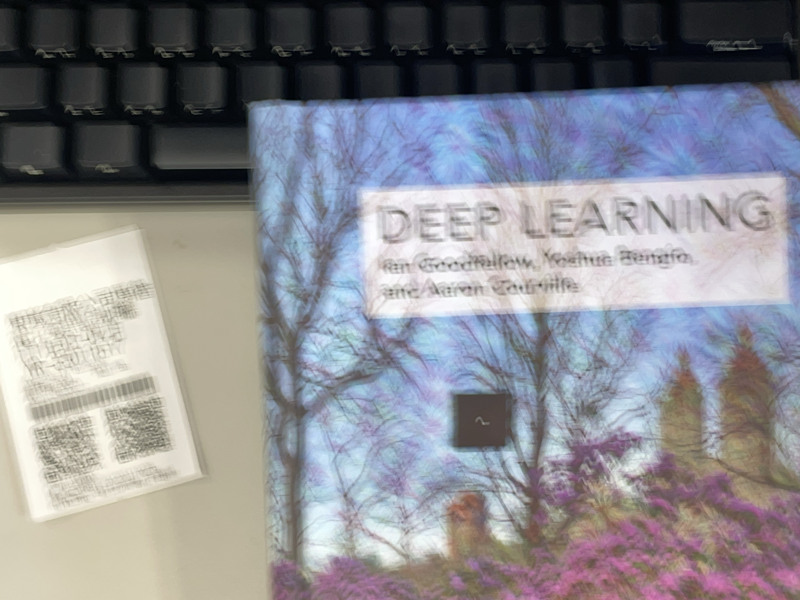

In [14]:
img_s

## Crop Blur Kernel from the Image

In [16]:
img_s.crop((470,410,500,440))

In [17]:
kernel = np.array(img_s.crop((470,410,500,440))).sum(axis=2)/3
img_blur = np.array(img_s)

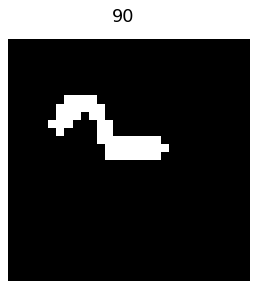

In [20]:
TH = 90
kernel_normal = kernel.copy()
kernel_normal[kernel_normal > TH] = 255
kernel_normal[kernel_normal <= TH] = 0
show_pic(kernel_normal, str(TH))

## Calculation of Different Methods

In [422]:
img_blurred = img_blur
k_blurred = kernel_normal

In [427]:
# Wiener
SNR_F = 100.0

Wiener_result = Wiener_deconv(img_blurred, k_blurred, SNR_F)

print("Finish Wiener")

# RL 
max_iter_RL = 45

RL_result = RL(img_blurred, k_blurred, max_iter_RL)

print("Finish RL")

# BRL
max_iter_RL = 40
rk = 12
sigma_r = 25.0/255/255
lamb_da = 0.001/255

BRL_result = BRL(img_blurred, k_blurred, max_iter_RL, lamb_da, sigma_r, rk)

print("Finish BRL")

# TVL1
max_iter = 1000
lamb_da = 0.01

TVL1_result = TVL1(img_blurred, k_blurred, max_iter, lamb_da)

print("Finish TVL1")

# TVL2
max_iter = 1000
lamb_da = 0.01

TVL2_result = TVL2(img_blurred, k_blurred, max_iter, lamb_da)

print("Finish TVL2")

# TVpoisson
max_iter = 1000
lamb_da = 0.01

TVpoisson_result = TVpoisson(img_blurred, k_blurred, max_iter, lamb_da)

print("Finish TVpoisson")

Finish Wiener
Finish RL
Finish BRL
Estimated params [sigma = 1.000 | tau = 1.000 | theta = 1.000 | L_est = 1.0000]
iter 100: ||r||_2 = 270.109, eps_pri = 2.798, ||s||_2 = 208.379, eps_dual = 1.218
iter 200: ||r||_2 = 127.175, eps_pri = 2.594, ||s||_2 = 155.586, eps_dual = 1.222
iter 300: ||r||_2 = 92.405, eps_pri = 2.579, ||s||_2 = 118.912, eps_dual = 1.223
iter 400: ||r||_2 = 69.677, eps_pri = 2.568, ||s||_2 = 92.182, eps_dual = 1.225
iter 500: ||r||_2 = 54.116, eps_pri = 2.562, ||s||_2 = 72.655, eps_dual = 1.225
iter 600: ||r||_2 = 42.163, eps_pri = 2.559, ||s||_2 = 57.153, eps_dual = 1.226
iter 700: ||r||_2 = 32.850, eps_pri = 2.557, ||s||_2 = 44.921, eps_dual = 1.226
iter 800: ||r||_2 = 26.032, eps_pri = 2.557, ||s||_2 = 35.814, eps_dual = 1.227
iter 900: ||r||_2 = 20.521, eps_pri = 2.556, ||s||_2 = 28.441, eps_dual = 1.227
op = pc_iteration_tot, evals = 1000, total_time (ms) = 318624.68615942635, avg_time (ms) = 318.62468615942635
op = copyprev, evals = 1000, total_time (ms) = 900

iter 300: ||r||_2 = 4.897, eps_pri = 2.509, ||s||_2 = 5.639, eps_dual = 1.204
iter 400: ||r||_2 = 2.345, eps_pri = 2.509, ||s||_2 = 2.667, eps_dual = 1.204
iter 500: ||r||_2 = 1.416, eps_pri = 2.509, ||s||_2 = 1.600, eps_dual = 1.204
iter 600: ||r||_2 = 0.953, eps_pri = 2.509, ||s||_2 = 1.082, eps_dual = 1.204
op = pc_iteration_tot, evals = 601, total_time (ms) = 196621.9904999598, avg_time (ms) = 327.1580540764722
op = copyprev, evals = 601, total_time (ms) = 5389.208084496204, avg_time (ms) = 8.967068360226628
op = calcz, evals = 601, total_time (ms) = 61326.995827956125, avg_time (ms) = 102.04159039593365
op = calcx, evals = 601, total_time (ms) = 65744.15771430358, avg_time (ms) = 109.39127739484789
op = omega_fn, evals = 601, total_time (ms) = 4366.16510793101, avg_time (ms) = 7.2648337902346265
op = xbar, evals = 601, total_time (ms) = 1361.1738150939345, avg_time (ms) = 2.2648482780265136
op = conv_check, evals = 13, total_time (ms) = 1473.527911992278, avg_time (ms) = 113.34830

## Visualization

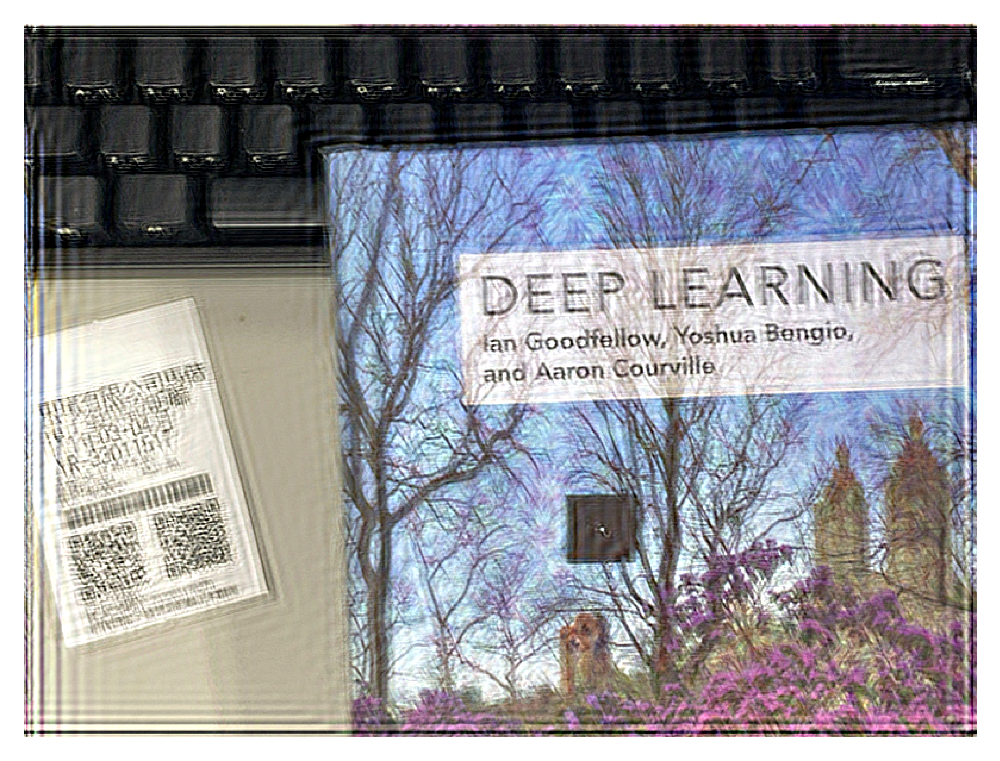

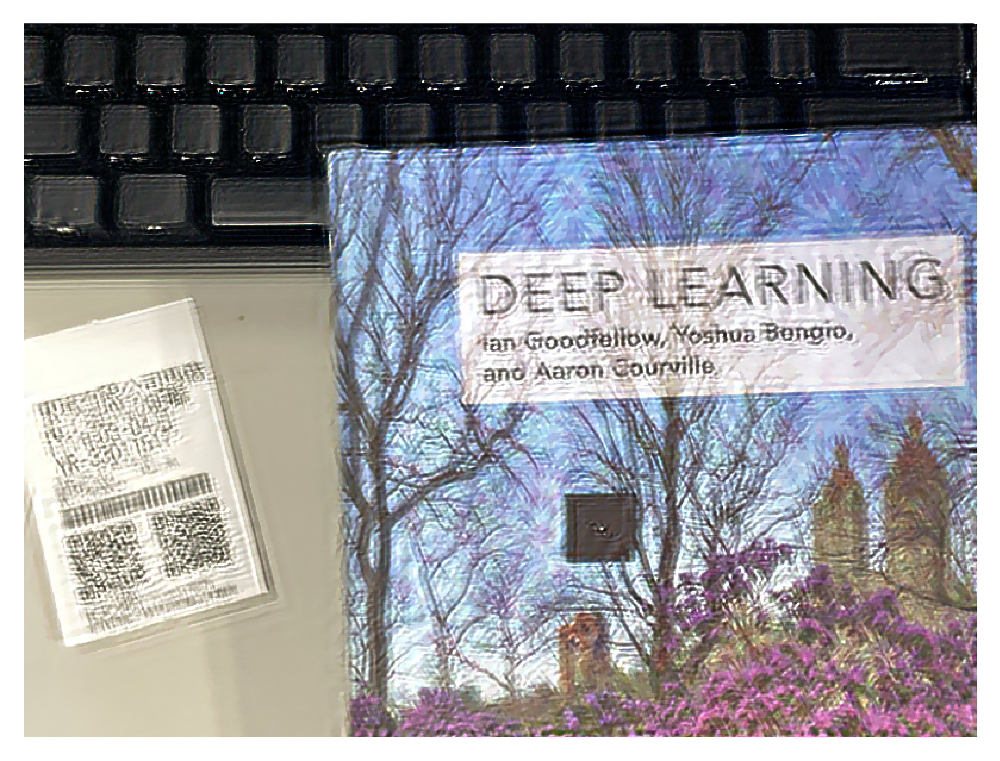

In [434]:
show_pic(Wiener_result, "", 500)
show_pic(BRL_result, "", 500)

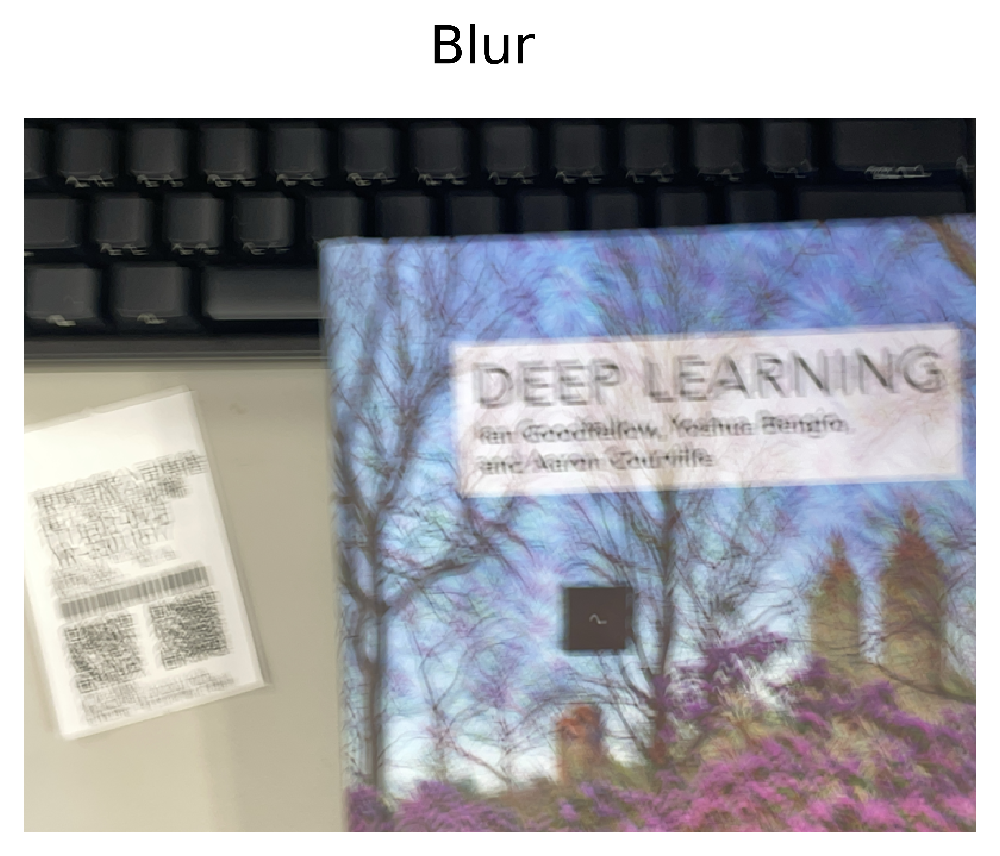

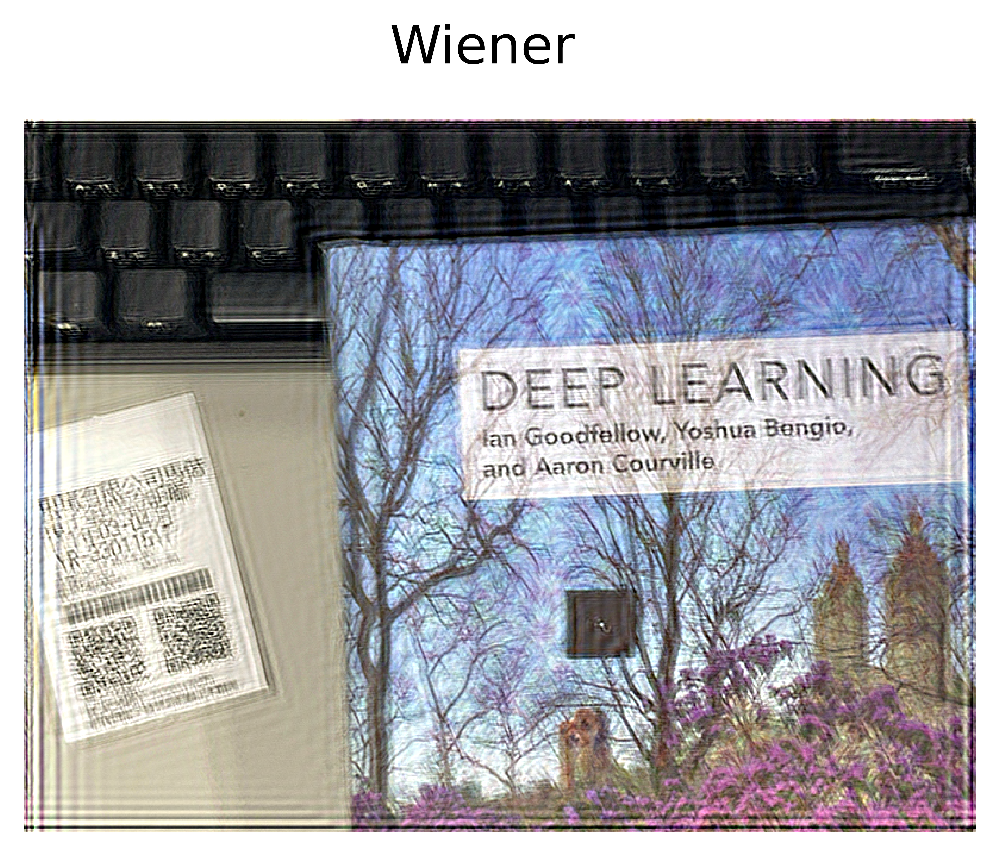

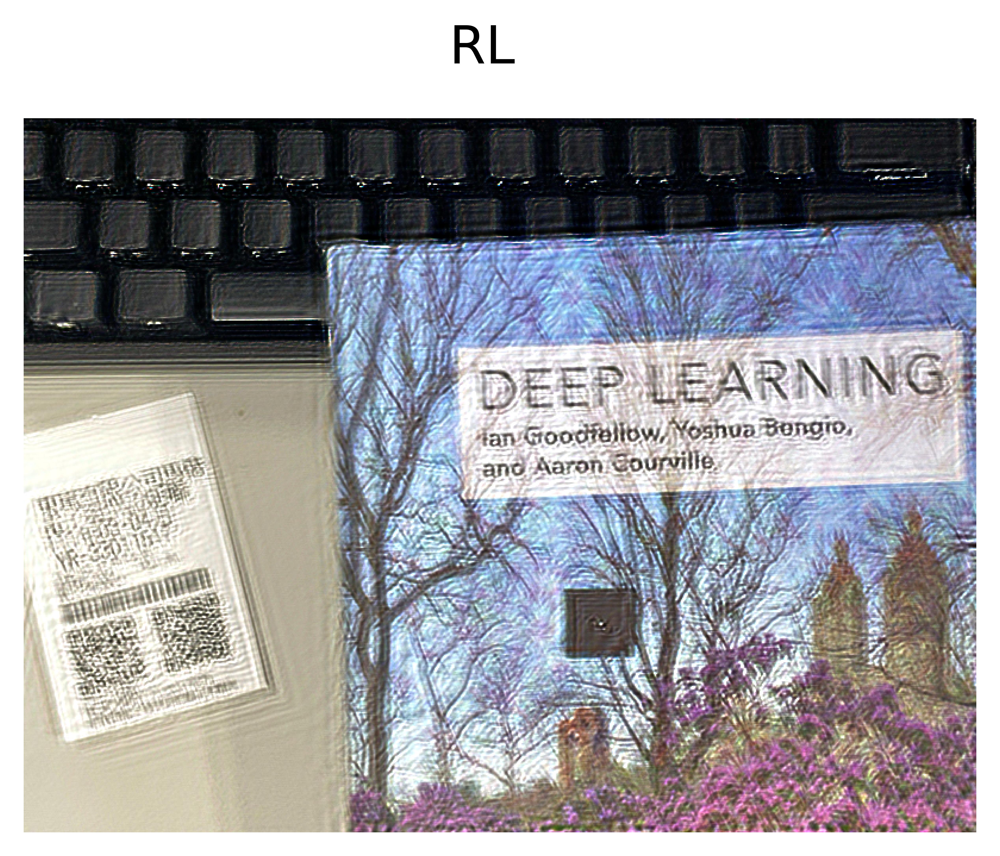

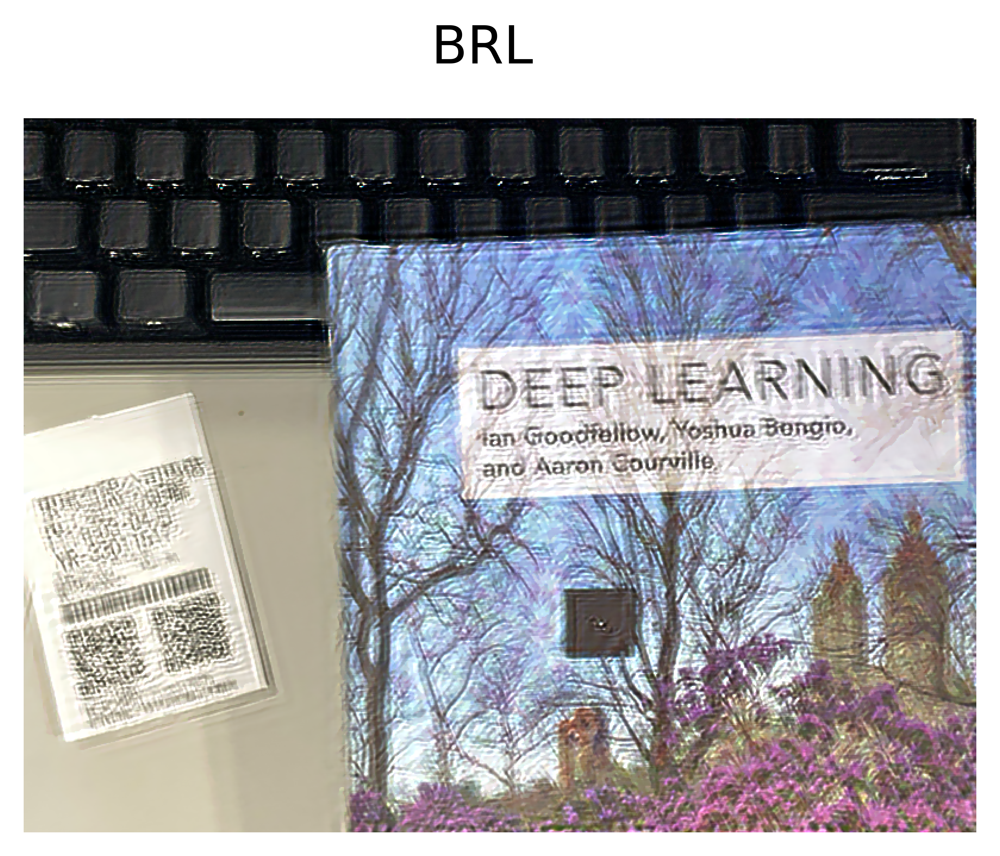

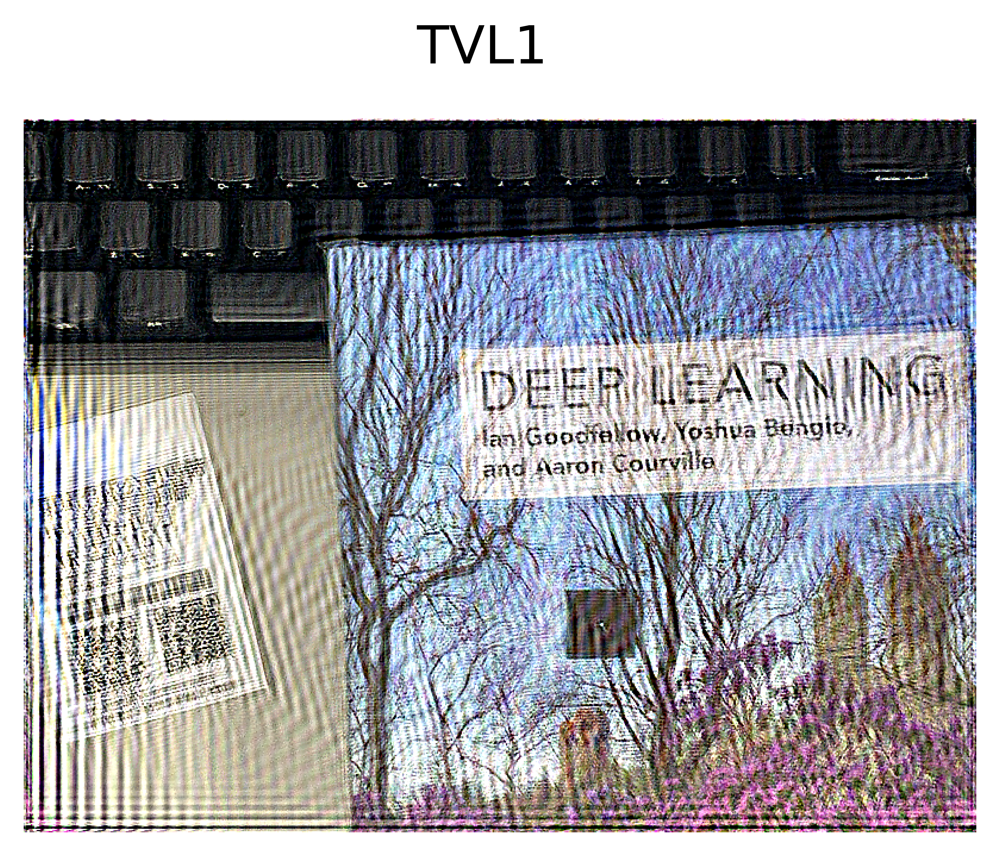

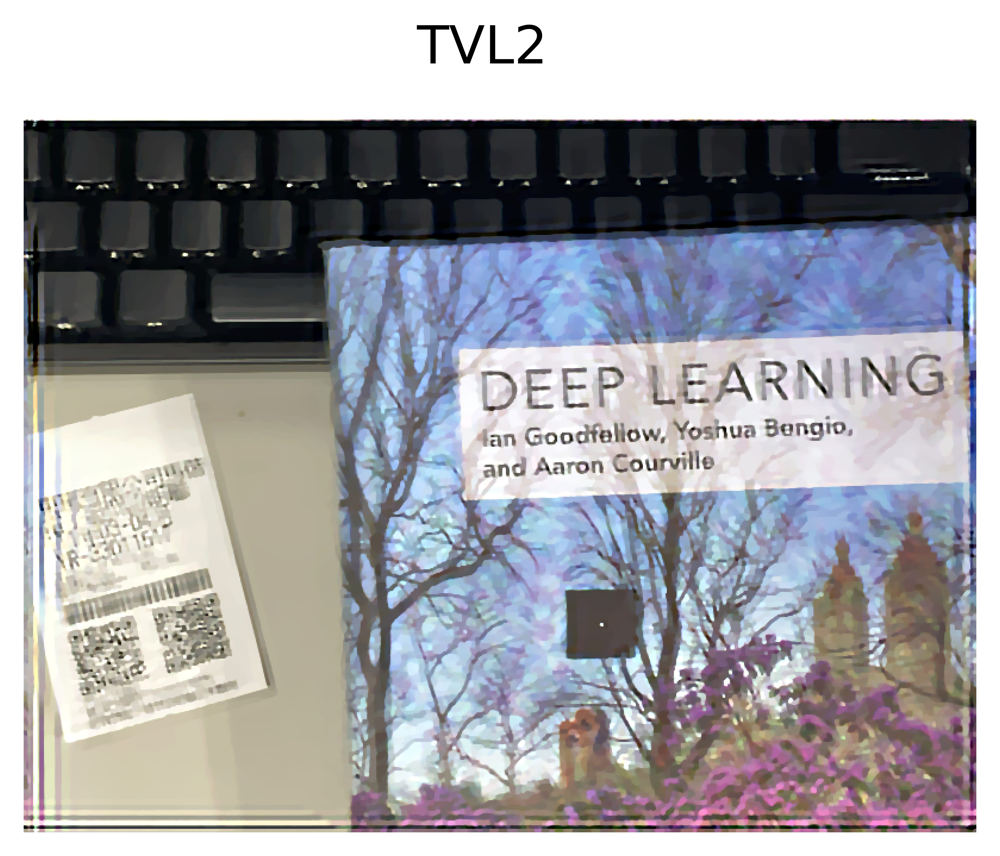

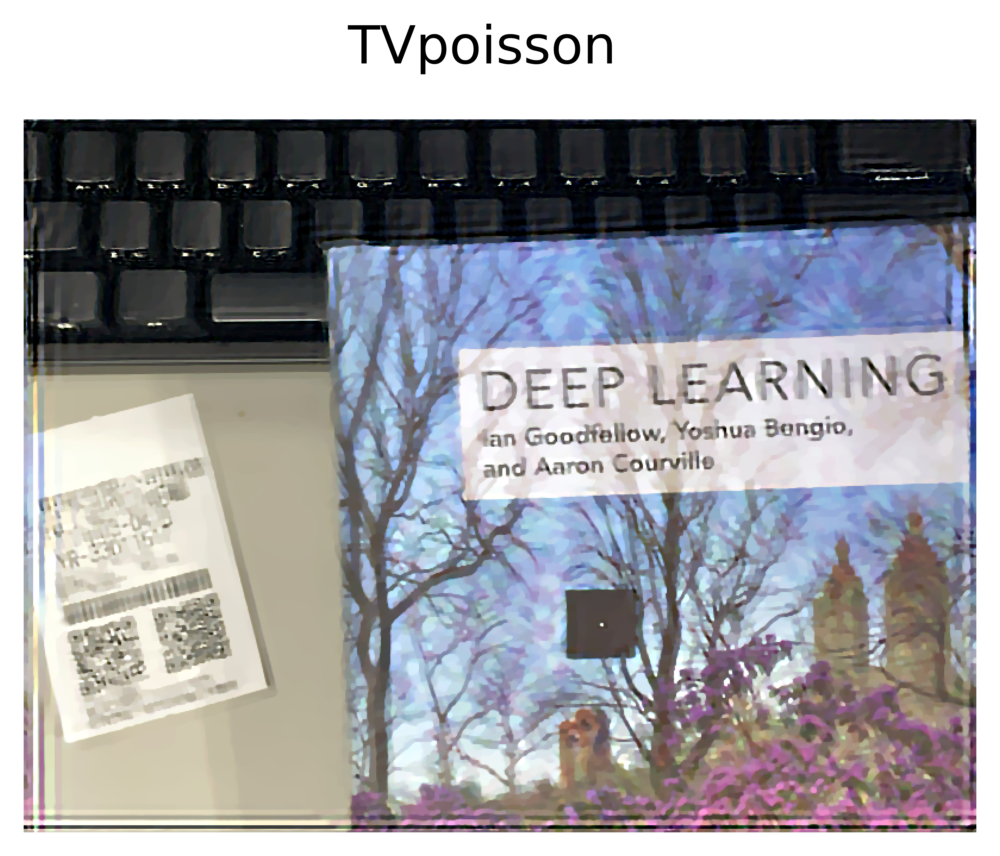

In [514]:
show_pic(img_blur, "Blur", 1200)
show_pic(Wiener_result, "Wiener", 1200)
show_pic(RL_result, "RL", 1200)
show_pic(BRL_result, "BRL", 1200)
show_pic(TVL1_result, "TVL1", 1200)
show_pic(TVL2_result, "TVL2", 1200)
show_pic(TVpoisson_result, "TVpoisson", 1200)